<a href="https://colab.research.google.com/github/bodejan/computer-vision/blob/main/notebooks/05_Filtros_Espaciales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 05. Filtros Espaciales

http://lapi.fi-p.unam.mx/wp-content/uploads/Practica-PDI-Filtrado-y-Fourier.pdf
https://classroom.google.com/c/NjE3NjEyOTgwNzM0/a/NjI3MTkwNzA4NTM2/details

## 1. Creación de imagenes con y sin ruido

(512, 512)


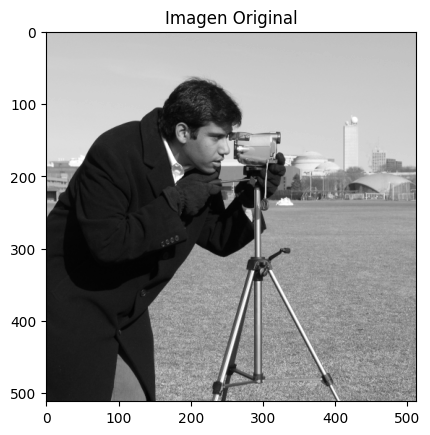

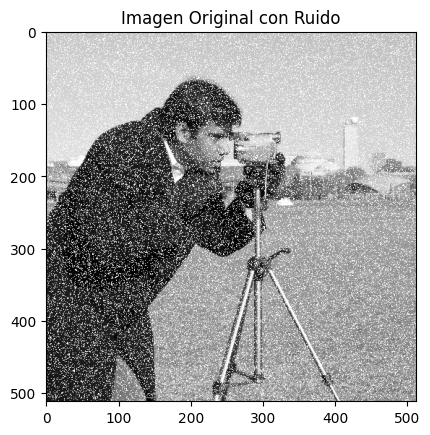

In [ ]:
import matplotlib.pyplot as plt
from skimage import data
from skimage.color import rgb2gray
import cv2
import numpy as np

def add_gaussian_noise(image, mean=0, stddev=25):
    """
    Agrega ruido gaussiano a una imagen.

    Args:
        image: La imagen a la que se le agregará el ruido.
        mean: La media del ruido gaussiano.
        stddev: La desviación estándar del ruido gaussiano.

    Returns:
        La imagen con ruido gaussiano.
    """
    noise = np.random.normal(mean, stddev, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, noise)
    return noisy_image

# Load the "camera" image from skimage.data
imagen = data.camera()
print(imagen.shape)
imagen_ruido = add_gaussian_noise(imagen, 0, 1)

plt.imshow(imagen, cmap='gray')
plt.title('Imagen Original')
plt.show()

plt.imshow(imagen_ruido, cmap='gray')
plt.title('Imagen Original con Ruido')
plt.show()


## 2. Aplicar los filtros paso bajas de bloque

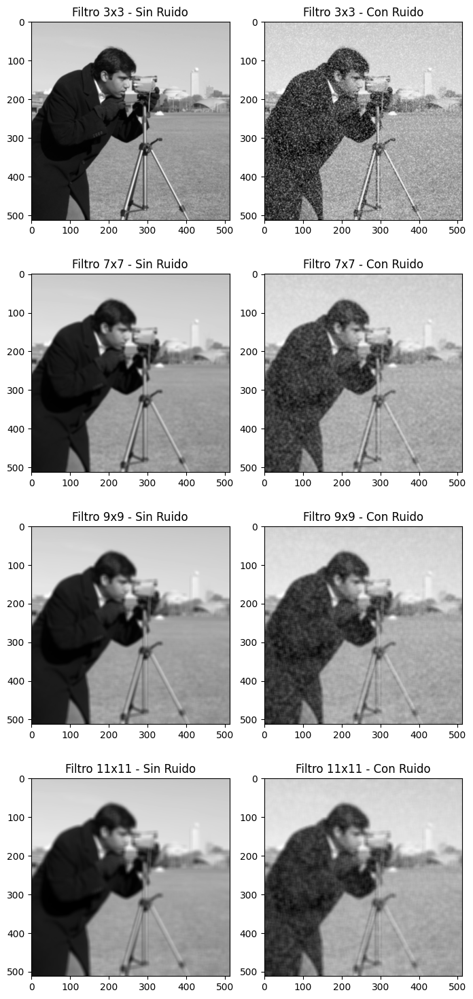

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def aplicar_filtros_paso_bajo(imagen_sin_ruido, imagen_con_ruido):
    tamanos_filtros = [3, 7, 9, 11]

    fig, axs = plt.subplots(len(tamanos_filtros), 2, figsize=(7, 15))

    imagenes_resultantes = []

    for i, tamano_filtro in enumerate(tamanos_filtros):
        # Definir el kernel del filtro de bloque
        kernel = np.ones((tamano_filtro, tamano_filtro), np.float32) / (tamano_filtro * tamano_filtro)

        # Aplicar el filtro a la imagen sin ruido
        imagen_filtrada_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel)

        # Aplicar el filtro a la imagen con ruido
        imagen_filtrada_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel)

        # Mostrar las imágenes filtradas
        axs[i, 0].imshow(imagen_filtrada_sin_ruido, cmap='gray')
        axs[i, 0].set_title(f'Filtro {tamano_filtro}x{tamano_filtro} - Sin Ruido')

        axs[i, 1].imshow(imagen_filtrada_con_ruido, cmap='gray')
        axs[i, 1].set_title(f'Filtro {tamano_filtro}x{tamano_filtro} - Con Ruido')

        imagenes_resultantes.append({"sin_ruido": (imagen_filtrada_sin_ruido, f'Filtro {tamano_filtro}x{tamano_filtro} - Sin Ruido'),
                                     "con_ruido": (imagen_filtrada_con_ruido, f'Filtro {tamano_filtro}x{tamano_filtro} - Con Ruido')})

    plt.tight_layout()
    plt.show()

    return imagenes_resultantes

imagenes_resultantes_2 = aplicar_filtros_paso_bajo(imagen, imagen_ruido)

## 3. Aplicar los filtros paso bajas binomiales

In [ ]:
# Usamos la fórmula binomial para calcular cada valor de k=0 hasta k=n.
from math import comb

def calcular_fila_pascal(n):
    fila = [comb(n, k) for k in range(n+1)]
    print('n:', n, 'fila:', fila)
    return fila

def calcular_matriz_norm(n):
    x = calcular_fila_pascal(n)
    x = np.array(x)
    X = np.outer(x, x.T)
    suma = np.sum(X)
    X_norm = 1/suma * X
    #print(f'Matriz para la fila n={n} del triángulo de Pascal normalizado:')
    #print(X_norm)

    return X_norm

n: 2 fila: [1, 2, 1]
n: 6 fila: [1, 6, 15, 20, 15, 6, 1]
n: 8 fila: [1, 8, 28, 56, 70, 56, 28, 8, 1]
n: 10 fila: [1, 10, 45, 120, 210, 252, 210, 120, 45, 10, 1]


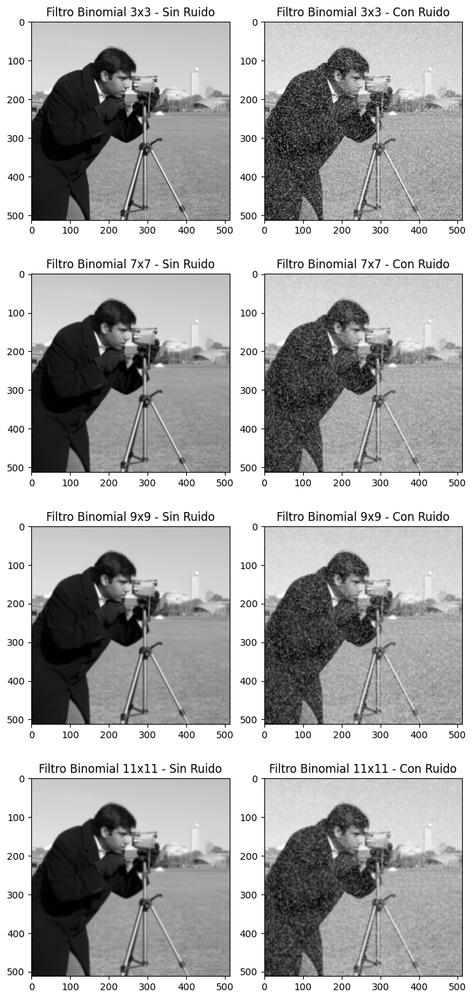

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def aplicar_filtros_paso_bajo_binomial(imagen_sin_ruido, imagen_con_ruido):
    tamanos_filtros = [3, 7, 9, 11]

    fig, axs = plt.subplots(len(tamanos_filtros), 2, figsize=(7, 15))

    for i, tamano_filtro in enumerate(tamanos_filtros):
        # Crear el kernel del filtro binomial para el tamaño actual
        kernel = calcular_matriz_norm(tamano_filtro - 1)

        # Aplicar el filtro a la imagen sin ruido
        imagen_filtrada_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel)

        # Aplicar el filtro a la imagen con ruido
        imagen_filtrada_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel)

        # Mostrar las imágenes filtradas
        axs[i, 0].imshow(imagen_filtrada_sin_ruido, cmap='gray')
        axs[i, 0].set_title(f'Filtro Binomial {tamano_filtro}x{tamano_filtro} - Sin Ruido')

        axs[i, 1].imshow(imagen_filtrada_con_ruido, cmap='gray')
        axs[i, 1].set_title(f'Filtro Binomial {tamano_filtro}x{tamano_filtro} - Con Ruido')

    plt.tight_layout()
    plt.show()

aplicar_filtros_paso_bajo_binomial(imagen, imagen_ruido)

## 4. Aplicar los filtros de la primera derivada

### 4.1. De bloque [1 -1]

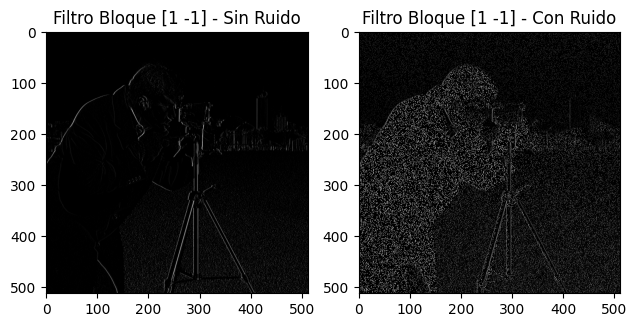

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def aplicar_filtro_derivada_bloque(imagen_sin_ruido, imagen_con_ruido):
    # Kernel para el filtro de primera derivada [1 -1]
    kernel_primera_derivada = np.array([[1, -1]], dtype=np.float32)

    # Aplicar el filtro a la imagen sin ruido
    imagen_filtrada_primera_derivada_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel_primera_derivada)
    #imagen_filtrada_primera_derivada_sin_ruido = imagen_filtrada_primera_derivada_sin_ruido + 128

    # Aplicar el filtro a la imagen con ruido
    imagen_filtrada_primera_derivada_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel_primera_derivada)
    #imagen_filtrada_primera_derivada_con_ruido = imagen_filtrada_primera_derivada_con_ruido + 128

    # Mostrar las imágenes filtradas
    plt.subplot(121)
    plt.imshow(imagen_filtrada_primera_derivada_sin_ruido, cmap='gray')
    plt.title('Filtro Bloque [1 -1] - Sin Ruido')

    plt.subplot(122)
    plt.imshow(imagen_filtrada_primera_derivada_con_ruido, cmap='gray')
    plt.title('Filtro Bloque [1 -1] - Con Ruido')

    plt.tight_layout()
    plt.show()

aplicar_filtro_derivada_bloque(imagen, imagen_ruido)


### 4.2. Prewitt

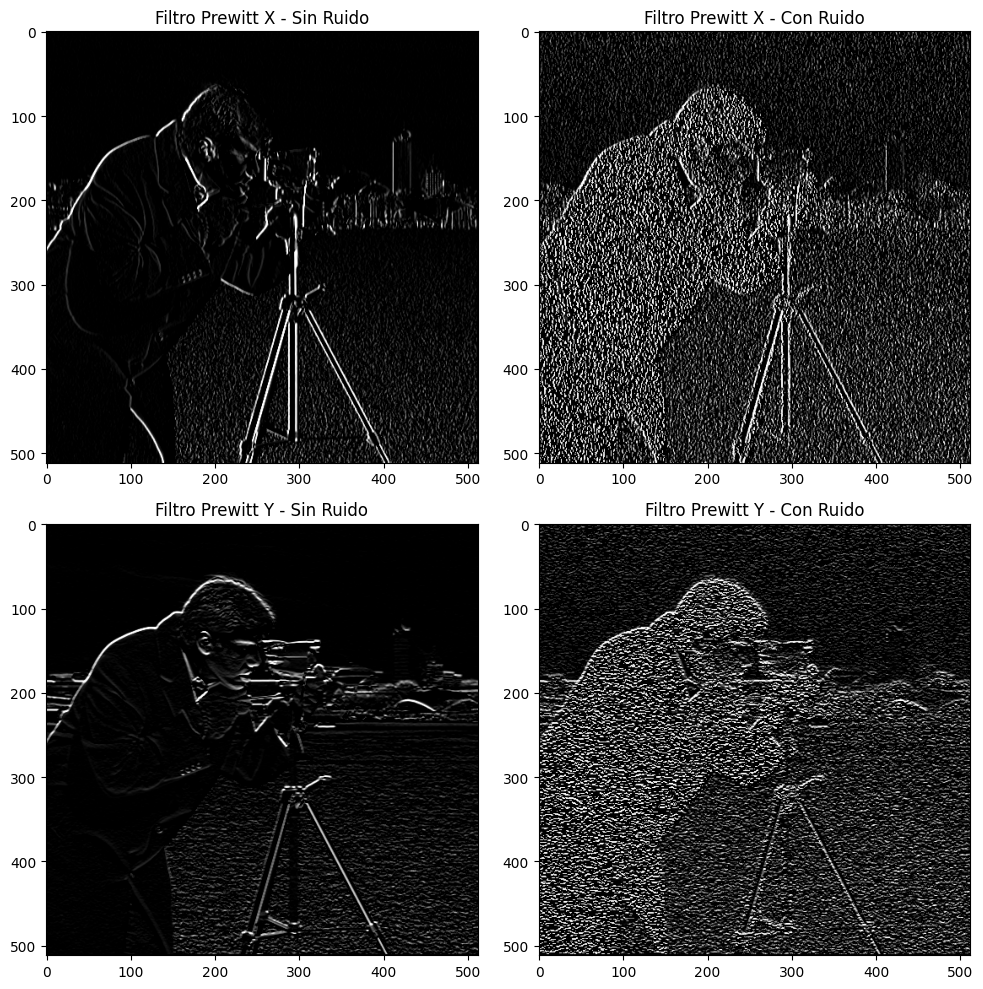

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def aplicar_filtro_prewitt(imagen_sin_ruido, imagen_con_ruido):
    # Kernels para el filtro Prewitt en las direcciones X e Y
    kernel_prewitt_x = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]], dtype=np.float32)
    kernel_prewitt_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]], dtype=np.float32)

    # Aplicar el filtro Prewitt en la dirección X a la imagen sin ruido
    imagen_filtrada_prewitt_x_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel_prewitt_x)
    #imagen_filtrada_prewitt_x_sin_ruido = imagen_filtrada_prewitt_x_sin_ruido + 128

    # Aplicar el filtro Prewitt en la dirección Y a la imagen sin ruido
    imagen_filtrada_prewitt_y_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel_prewitt_y)
    #imagen_filtrada_prewitt_y_sin_ruido = imagen_filtrada_prewitt_y_sin_ruido + 128

    # Aplicar el filtro Prewitt en la dirección X a la imagen con ruido
    imagen_filtrada_prewitt_x_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel_prewitt_x)
    #imagen_filtrada_prewitt_x_con_ruido = imagen_filtrada_prewitt_x_con_ruido + 128

    # Aplicar el filtro Prewitt en la dirección Y a la imagen con ruido
    imagen_filtrada_prewitt_y_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel_prewitt_y)
    #imagen_filtrada_prewitt_y_con_ruido = imagen_filtrada_prewitt_y_con_ruido + 128

    # Mostrar las imágenes filtradas
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))


    axs[0, 0].imshow(imagen_filtrada_prewitt_x_sin_ruido, cmap='gray')
    axs[0, 0].set_title('Filtro Prewitt X - Sin Ruido')

    axs[1, 0].imshow(imagen_filtrada_prewitt_y_sin_ruido, cmap='gray')
    axs[1, 0].set_title('Filtro Prewitt Y - Sin Ruido')

    axs[0, 1].imshow(imagen_filtrada_prewitt_x_con_ruido, cmap='gray')
    axs[0, 1].set_title('Filtro Prewitt X - Con Ruido')

    axs[1, 1].imshow(imagen_filtrada_prewitt_y_con_ruido, cmap='gray')
    axs[1, 1].set_title('Filtro Prewitt Y - Con Ruido')

    plt.tight_layout()
    plt.show()

aplicar_filtro_prewitt(imagen, imagen_ruido)


### 4.3. Sobel

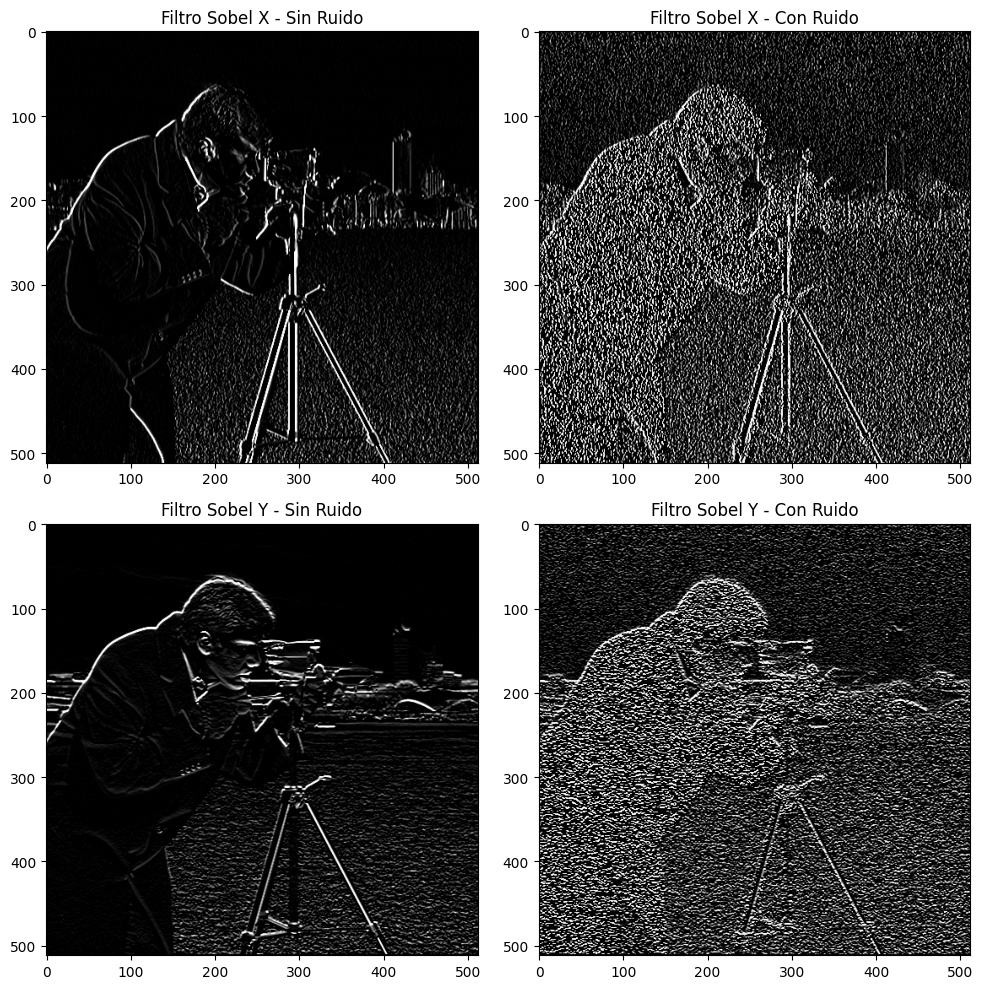

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def aplicar_filtro_sobel(imagen_sin_ruido, imagen_con_ruido):
    # Kernels para el filtro Sobel en las direcciones X e Y
    kernel_sobel_x = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]], dtype=np.float32)
    kernel_sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype=np.float32)

    # Aplicar el filtro Sobel en la dirección X a la imagen sin ruido
    imagen_filtrada_sobel_x_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel_sobel_x)
    #imagen_filtrada_sobel_x_sin_ruido = imagen_filtrada_sobel_x_sin_ruido + 128

    # Aplicar el filtro Sobel en la dirección Y a la imagen sin ruido
    imagen_filtrada_sobel_y_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel_sobel_y)
    #imagen_filtrada_sobel_y_sin_ruido = imagen_filtrada_sobel_y_sin_ruido + 128

    # Aplicar el filtro Sobel en la dirección X a la imagen con ruido
    imagen_filtrada_sobel_x_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel_sobel_x)
    #imagen_filtrada_sobel_x_con_ruido = imagen_filtrada_sobel_x_con_ruido + 128

    # Aplicar el filtro Sobel en la dirección Y a la imagen con ruido
    imagen_filtrada_sobel_y_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel_sobel_y)
    #imagen_filtrada_sobel_y_con_ruido = imagen_filtrada_sobel_y_con_ruido + 128

    # Mostrar las imágenes filtradas
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))

    axs[0, 0].imshow(imagen_filtrada_sobel_x_sin_ruido, cmap='gray')
    axs[0, 0].set_title('Filtro Sobel X - Sin Ruido')

    axs[1, 0].imshow(imagen_filtrada_sobel_y_sin_ruido, cmap='gray')
    axs[1, 0].set_title('Filtro Sobel Y - Sin Ruido')

    axs[0, 1].imshow(imagen_filtrada_sobel_x_con_ruido, cmap='gray')
    axs[0, 1].set_title('Filtro Sobel X - Con Ruido')

    axs[1, 1].imshow(imagen_filtrada_sobel_y_con_ruido, cmap='gray')
    axs[1, 1].set_title('Filtro Sobel Y - Con Ruido')

    plt.tight_layout()
    plt.show()


aplicar_filtro_sobel(imagen, imagen_ruido)

### 4.4. Gaussiana

n: 3 fila: [1, 3, 3, 1]
derivada: [1, 2, 0, -2, -1]
n: 5 fila: [1, 5, 10, 10, 5, 1]
derivada: [1, 4, 5, 0, -5, -4, -1]
n: 9 fila: [1, 9, 36, 84, 126, 126, 84, 36, 9, 1]
derivada: [1, 8, 27, 48, 42, 0, -42, -48, -27, -8, -1]


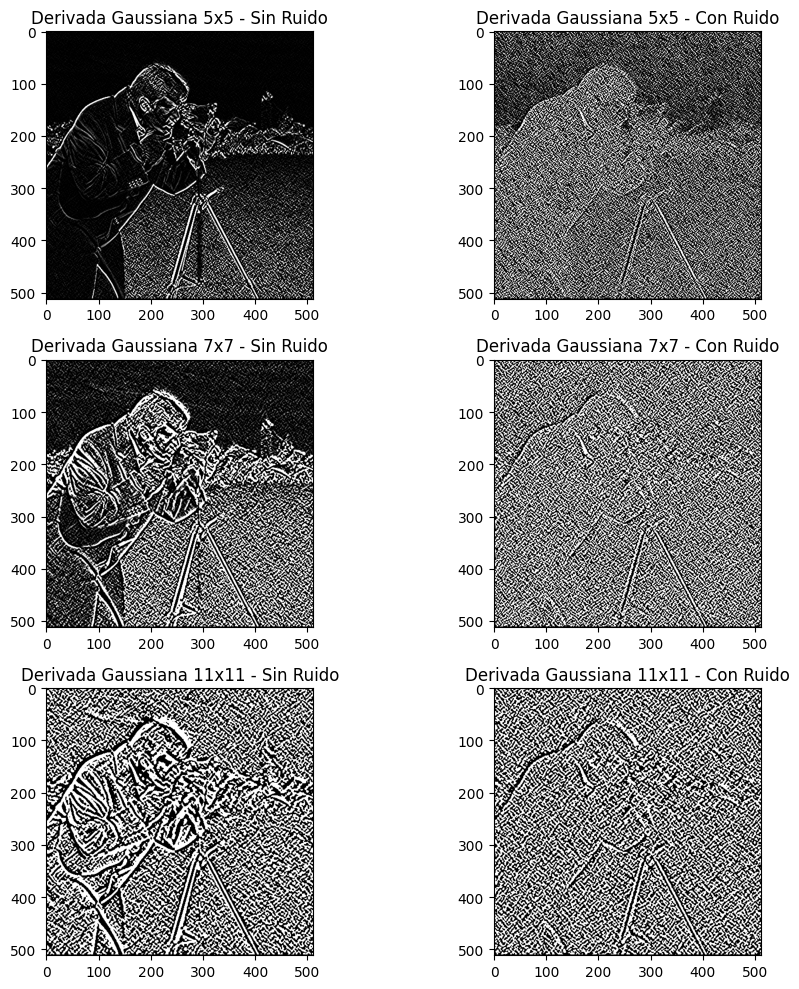

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def approx_primera_derivada_gaussiana(kernel):
    # usamos [1, -1]
    fila_pascal = calcular_fila_pascal(kernel - 2)
    fila_pascal_negativa = fila_pascal.copy()
    fila_pascal_negativa = [-x for x in fila_pascal_negativa]

    fila_pascal.append(0)
    fila_pascal_negativa.insert(0, 0)

    approx_derivada = []
    for x,y in zip(fila_pascal, fila_pascal_negativa):
      approx_derivada.append(x+y)

    print(f'derivada: {approx_derivada}')
    approx_derivada = np.array(approx_derivada)
    approx_derivada_matriz = np.outer(approx_derivada, approx_derivada.T)

    return approx_derivada_matriz


def aplicar_filtro_derivada_gaussiana(imagen_sin_ruido, imagen_con_ruido):
    tamanos_kernel = [5, 7, 11]

    fig, axs = plt.subplots(len(tamanos_kernel), 2, figsize=(10, 10))

    for i, tamano_kernel in enumerate(tamanos_kernel):
        # Crear el kernel Gaussiano para la primera derivada
        kernel_gaussiano = approx_primera_derivada_gaussiana(tamano_kernel)

        # Aplicar el filtro de la primera derivada de Gaussiana a la imagen sin ruido
        imagen_filtrada_derivada_gaussiana_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel_gaussiano)
        #imagen_filtrada_derivada_gaussiana_sin_ruido = imagen_filtrada_derivada_gaussiana_sin_ruido + 128

        # Aplicar el filtro de la primera derivada de Gaussiana a la imagen con ruido
        imagen_filtrada_derivada_gaussiana_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel_gaussiano)
        #imagen_filtrada_derivada_gaussiana_con_ruido = imagen_filtrada_derivada_gaussiana_con_ruido + 128

        # Mostrar las imágenes filtradas
        axs[i, 0].imshow(imagen_filtrada_derivada_gaussiana_sin_ruido, cmap='gray')
        axs[i, 0].set_title(f'Derivada Gaussiana {tamano_kernel}x{tamano_kernel} - Sin Ruido')

        axs[i, 1].imshow(imagen_filtrada_derivada_gaussiana_con_ruido, cmap='gray')
        axs[i, 1].set_title(f'Derivada Gaussiana {tamano_kernel}x{tamano_kernel} - Con Ruido')

    plt.tight_layout()
    plt.show()



aplicar_filtro_derivada_gaussiana(imagen, imagen_ruido)

## 5. Aplicar los filtros de la segunda derivada

### 5.1. Laplaciano

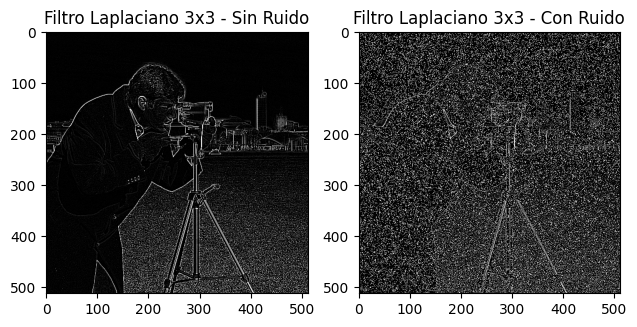

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def aplicar_filtro_laplaciano(imagen_sin_ruido, imagen_con_ruido):
    # Definir el kernel del filtro Laplaciano 3x3
    kernel_laplaciano = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]], dtype=np.float32)

    # Aplicar el filtro a la imagen sin ruido
    imagen_filtrada_laplaciano_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel_laplaciano)
    #imagen_filtrada_laplaciano_sin_ruido = imagen_filtrada_laplaciano_sin_ruido + 128

    # Aplicar el filtro a la imagen con ruido
    imagen_filtrada_laplaciano_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel_laplaciano)
    #imagen_filtrada_laplaciano_con_ruido = imagen_filtrada_laplaciano_con_ruido + 128

    # Mostrar las imágenes filtradas
    plt.subplot(121)
    plt.imshow(imagen_filtrada_laplaciano_sin_ruido, cmap='gray')
    plt.title('Filtro Laplaciano 3x3 - Sin Ruido')

    plt.subplot(122)
    plt.imshow(imagen_filtrada_laplaciano_con_ruido, cmap='gray')
    plt.title('Filtro Laplaciano 3x3 - Con Ruido')

    plt.tight_layout()
    plt.show()

aplicar_filtro_laplaciano(imagen, imagen_ruido)


### 5.2. Gausiana

n: 2 fila: [1, 2, 1]
derivada: [1, 1, -1, -1]
derivada 2: [1, 0, -2, 0, 1]
n: 4 fila: [1, 4, 6, 4, 1]
derivada: [1, 3, 2, -2, -3, -1]
derivada 2: [1, 2, -1, -4, -1, 2, 1]
n: 8 fila: [1, 8, 28, 56, 70, 56, 28, 8, 1]
derivada: [1, 7, 20, 28, 14, -14, -28, -20, -7, -1]
derivada 2: [1, 6, 13, 8, -14, -28, -14, 8, 13, 6, 1]


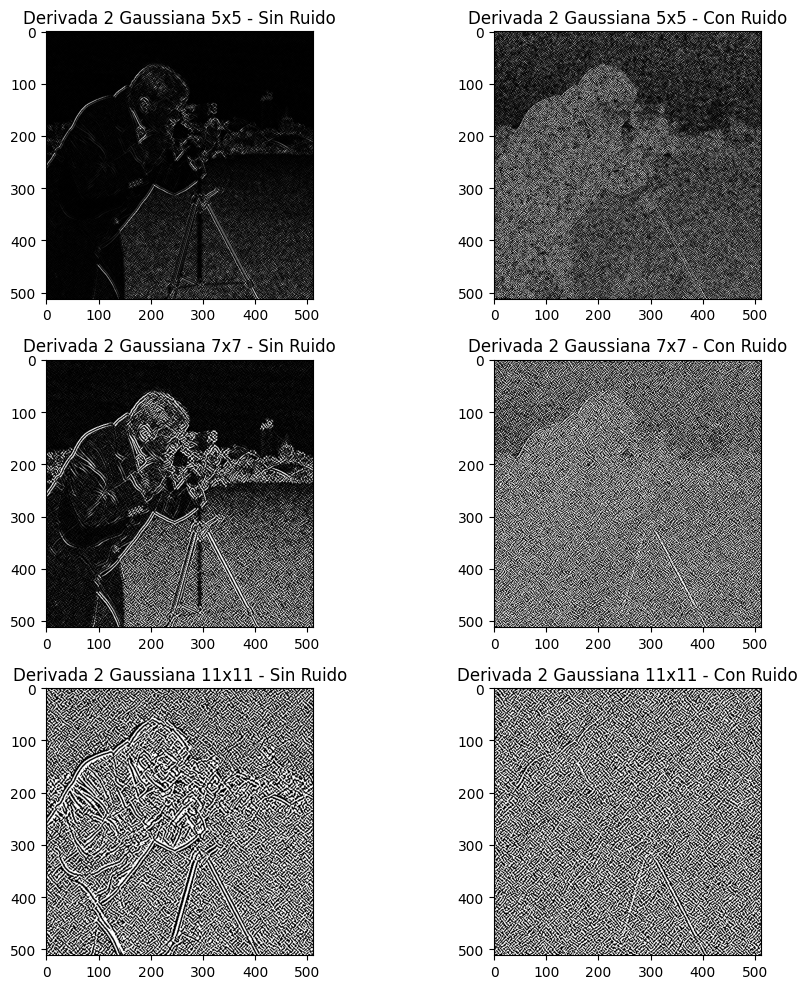

In [ ]:
def approx_segunda_derivada_gaussiana(kernel):
    # usamos [1, -1]
    fila_pascal = calcular_fila_pascal(kernel - 3)
    fila_pascal_negativa = fila_pascal.copy()
    fila_pascal_negativa = [-x for x in fila_pascal_negativa]

    fila_pascal.append(0)
    fila_pascal_negativa.insert(0, 0)

    approx_derivada = []
    for x,y in zip(fila_pascal, fila_pascal_negativa):
      approx_derivada.append(x+y)

    print(f'derivada: {approx_derivada}')

    fila_pascal_derivada_1 = approx_derivada
    fila_pascal_derivada_1_negativa = fila_pascal_derivada_1.copy()
    fila_pascal_derivada_1_negativa = [-x for x in fila_pascal_derivada_1_negativa]

    fila_pascal_derivada_1.append(0)
    fila_pascal_derivada_1_negativa.insert(0, 0)

    approx_derivada_2 = []
    for x,y in zip(fila_pascal_derivada_1, fila_pascal_derivada_1_negativa):
      approx_derivada_2.append(x+y)

    print(f'derivada 2: {approx_derivada_2}')


    approx_derivada_2 = np.array(approx_derivada_2)
    approx_derivada_matriz = np.outer(approx_derivada_2, approx_derivada_2.T)

    return approx_derivada_matriz

def aplicar_filtro_derivada_dos_gaussiana(imagen_sin_ruido, imagen_con_ruido):
    tamanos_kernel = [5, 7, 11]

    fig, axs = plt.subplots(len(tamanos_kernel), 2, figsize=(10, 10))

    for i, tamano_kernel in enumerate(tamanos_kernel):
        # Crear el kernel Gaussiano para la segunda derivada
        kernel_gaussiano = approx_segunda_derivada_gaussiana(tamano_kernel)

        # Aplicar el filtro de la segunda derivada de Gaussiana a la imagen sin ruido
        imagen_filtrada_derivada_gaussiana_sin_ruido = cv2.filter2D(imagen_sin_ruido, -1, kernel_gaussiano)
        #imagen_filtrada_derivada_gaussiana_sin_ruido = imagen_filtrada_derivada_gaussiana_sin_ruido + 128

        # Aplicar el filtro de la segunda derivada de Gaussiana a la imagen con ruido
        imagen_filtrada_derivada_gaussiana_con_ruido = cv2.filter2D(imagen_con_ruido, -1, kernel_gaussiano)
        #imagen_filtrada_derivada_gaussiana_con_ruido = imagen_filtrada_derivada_gaussiana_con_ruido + 128

        # Mostrar las imágenes filtradas
        axs[i, 0].imshow(imagen_filtrada_derivada_gaussiana_sin_ruido, cmap='gray')
        axs[i, 0].set_title(f'Derivada 2 Gaussiana {tamano_kernel}x{tamano_kernel} - Sin Ruido')

        axs[i, 1].imshow(imagen_filtrada_derivada_gaussiana_con_ruido, cmap='gray')
        axs[i, 1].set_title(f'Derivada 2 Gaussiana {tamano_kernel}x{tamano_kernel} - Con Ruido')

    plt.tight_layout()
    plt.show()

aplicar_filtro_derivada_dos_gaussiana(imagen, imagen_ruido)

## 6. Difuminar los imágenes y aplicar unsharp masking

### Preparación: Aplicar un filtro de paso bajas 5x5 a las imágenes

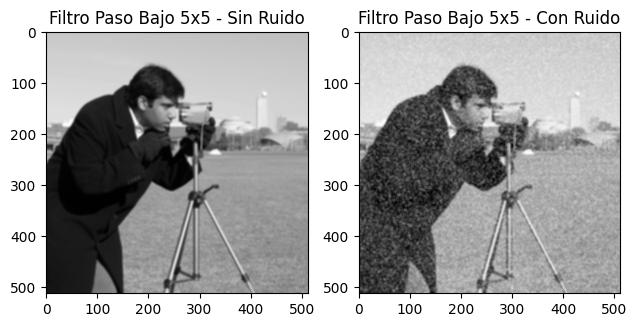

In [ ]:
def aplicar_filtro_paso_bajo(tamano, imagen):
    kernel = np.ones((tamano, tamano), dtype=np.float64) / (tamano*tamano)  # Normalizing the kernel

    filtered_image = cv2.filter2D(imagen, -1, kernel)
    return filtered_image

imagen_sin_ruido_difum = aplicar_filtro_paso_bajo(5, imagen)
imagen_con_ruido_difum = aplicar_filtro_paso_bajo(5, imagen_ruido)

# Mostrar las imágenes filtradas
plt.subplot(121)
plt.imshow(imagen_sin_ruido_difum, cmap='gray')
plt.title('Filtro Paso Bajo 5x5 - Sin Ruido')

plt.subplot(122)
plt.imshow(imagen_con_ruido_difum, cmap='gray')
plt.title('Filtro Paso Bajo 5x5 - Con Ruido')

plt.tight_layout()

### a) Filtro paso bajas de bloque de orden 3x3 y 7x7

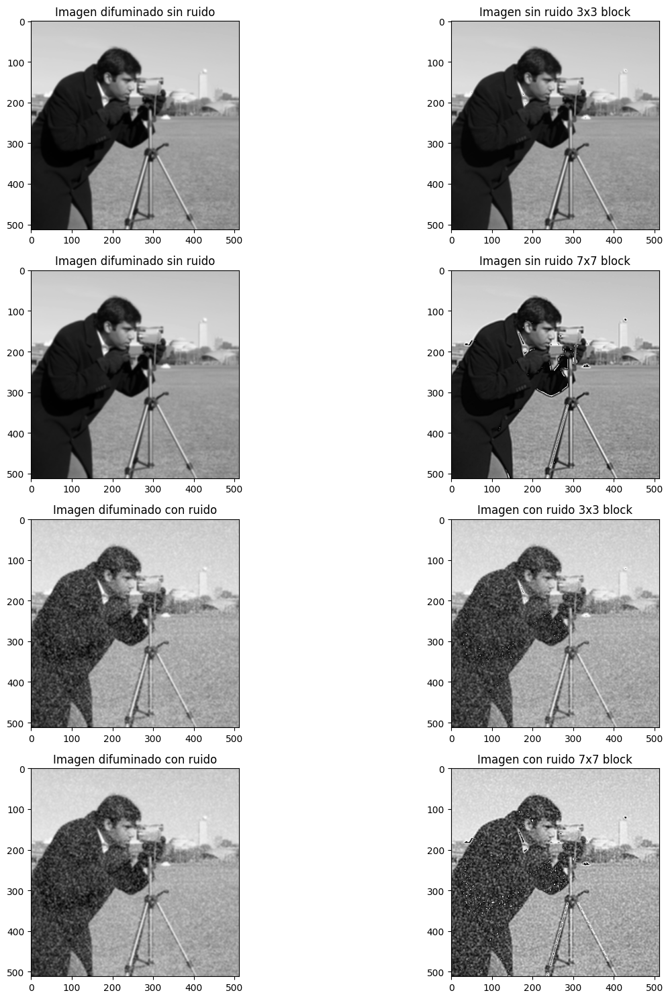

In [ ]:
from scipy import signal

def display_images_2_in_a_row(images, titles):
    # Create a 2x4 grid of subplots
    fig, axes = plt.subplots(4, 2, figsize=(15, 15))

    # Flatten the 2D array of axes to make it easier to iterate through
    axes = axes.flatten()

    # Loop through images and display them in subplots
    for i, ax in enumerate(axes):
        if i < len(images):
            ax.imshow(images[i], cmap="gray")
            ax.set_title(titles[i])
        else:
            ax.axis('off')  # Turn off empty subplots

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plot
    plt.show()

def unsharp_masking(image, kernel, k):
    blurred = cv2.filter2D(image, -1, kernel)
    enhanced = image + k * (image - blurred)
    return enhanced

# Definir los kernels para los filtros paso bajas
kernel_3x3 = np.ones((3, 3), dtype=np.float32) / 9.0  # Filtro paso bajas de bloque 3x3
kernel_7x7 = np.ones((7, 7), dtype=np.float32) / 49.0  # Filtro paso bajas de bloque 7x7

# Aplicar el filtro unsharp masking con los diferentes kernels
result_3x3_block = unsharp_masking(imagen_sin_ruido_difum, kernel_3x3, 1)
result_3x3_block_ruido = unsharp_masking(imagen_con_ruido_difum, kernel_3x3, 1)
result_7x7_block = unsharp_masking(imagen_sin_ruido_difum, kernel_7x7, 1)
result_7x7_block_ruido = unsharp_masking(imagen_con_ruido_difum, kernel_7x7, 1)

images = [imagen_sin_ruido_difum, result_3x3_block,
          imagen_sin_ruido_difum, result_7x7_block,
          imagen_con_ruido_difum, result_3x3_block_ruido,
          imagen_con_ruido_difum, result_7x7_block_ruido]

titles = ["Imagen difuminado sin ruido", "Imagen sin ruido 3x3 block",
          "Imagen difuminado sin ruido", "Imagen sin ruido 7x7 block",
          "Imagen difuminado con ruido", "Imagen con ruido 3x3 block",
          "Imagen difuminado con ruido", "Imagen con ruido 7x7 block"]

display_images_2_in_a_row(images, titles)


### b) Filtro paso bajas binomial de orden 3x3 y 7x7

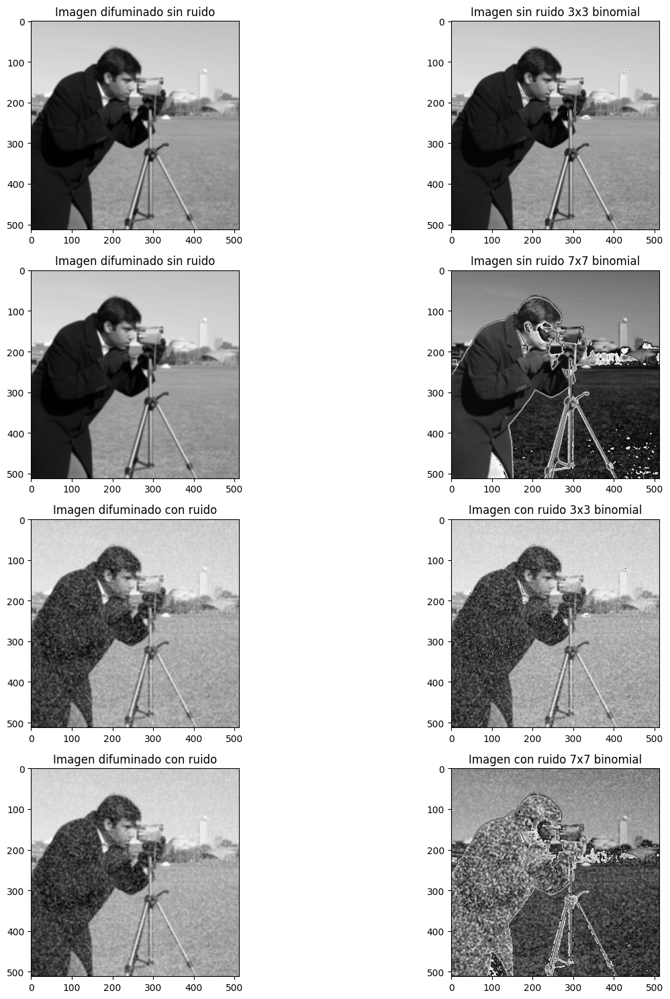

In [ ]:
# Para el filtro paso bajas binomial, puedes usar scipy.signal.convolve2d
kernel_binomial_3x3 = np.array([[1, 2, 1],
                                 [2, 4, 2],
                                 [1, 2, 1]]) / 16.0  # Filtro paso bajas binomial 3x3

kernel_binomial_7x7 = np.array([[1, 1, 2, 2, 2, 1, 1],
                                 [1, 2, 2, 4, 2, 2, 1],
                                 [2, 2, 4, 8, 4, 2, 2],
                                 [2, 4, 8, 16, 8, 4, 2],
                                 [2, 2, 4, 8, 4, 2, 2],
                                 [1, 2, 2, 4, 2, 2, 1],
                                 [1, 1, 2, 2, 2, 1, 1]]) / 256.0  # Filtro paso bajas binomial 7x7

result_3x3_binomial = unsharp_masking(imagen_sin_ruido_difum, kernel_binomial_3x3, 2)
result_3x3_binomial_ruido = unsharp_masking(imagen_con_ruido_difum, kernel_binomial_3x3, 2)
result_7x7_binomial = unsharp_masking(imagen_sin_ruido_difum, kernel_binomial_7x7, 2)
result_7x7_binomial_ruido = unsharp_masking(imagen_con_ruido_difum, kernel_binomial_7x7, 2)

# Mostrar y guardar los resultados para los filtros paso bajas binomiales
images = [imagen_sin_ruido_difum, result_3x3_binomial,
          imagen_sin_ruido_difum, result_7x7_binomial,
          imagen_con_ruido_difum, result_3x3_binomial_ruido,
          imagen_con_ruido_difum, result_7x7_binomial_ruido]

titles = ["Imagen difuminado sin ruido", "Imagen sin ruido 3x3 binomial",
          "Imagen difuminado sin ruido", "Imagen sin ruido 7x7 binomial",
          "Imagen difuminado con ruido", "Imagen con ruido 3x3 binomial",
          "Imagen difuminado con ruido", "Imagen con ruido 7x7 binomial"]

display_images_2_in_a_row(images, titles)

## 7

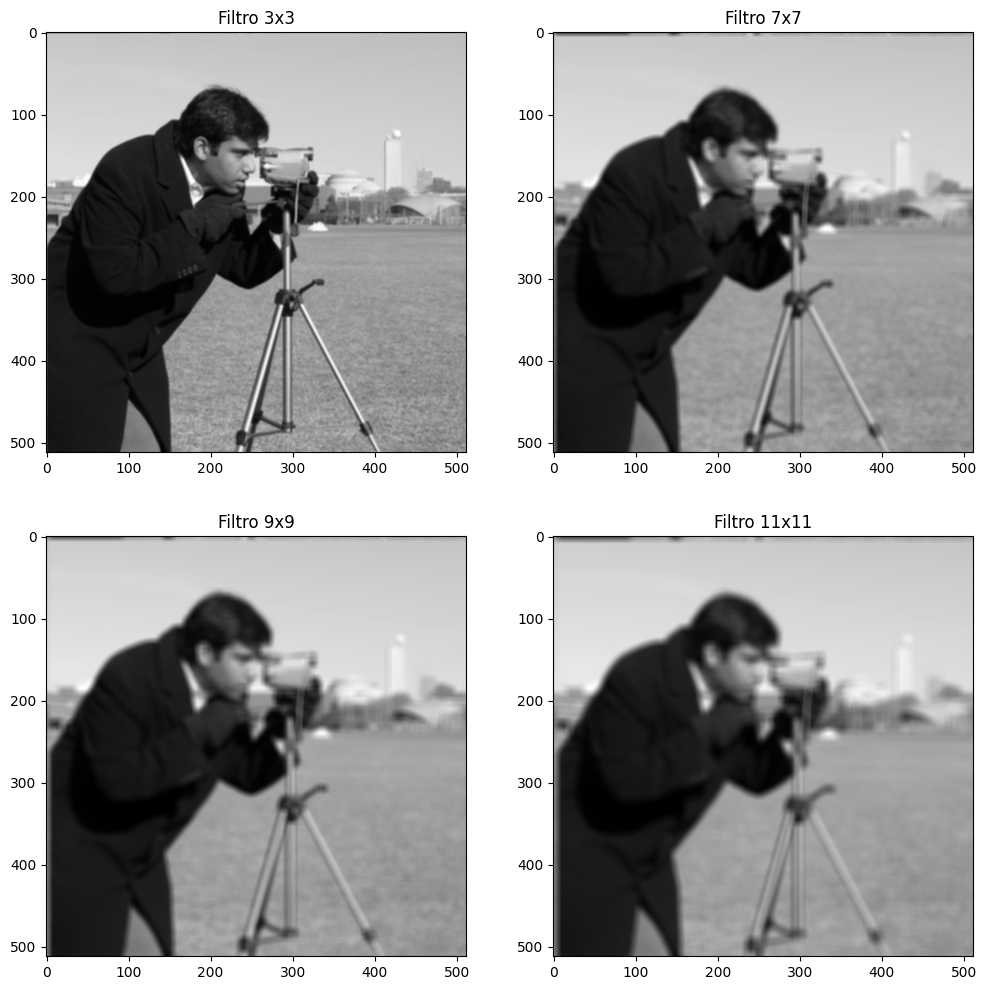

In [ ]:
import numpy as np
import scipy.fft as fft
import scipy.signal as signal
import matplotlib.pyplot as plt

def convolucion_dft(imagen, filtro):
    """
    Realiza la convolución de la imagen con el filtro utilizando la DFT.

    Args:
        imagen (numpy.ndarray): La imagen de entrada.
        filtro (numpy.ndarray): El filtro a aplicar.

    Returns:
        numpy.ndarray: La imagen convolucionada.
    """
    imagen_fft = fft.fft2(imagen)
    filtro_fft = fft.fft2(filtro, s=imagen.shape)
    resultado_fft = imagen_fft * filtro_fft
    resultado = fft.ifft2(resultado_fft).real
    return resultado

def main():
    # Definir filtros paso bajas de diferentes tamaños (3x3, 7x7, 9x9, 11x11)
    filtro_3x3 = np.ones((3, 3)) / 9
    filtro_7x7 = np.ones((7, 7)) / 49
    filtro_9x9 = np.ones((9, 9)) / 81
    filtro_11x11 = np.ones((11, 11)) / 121

    # Realizar la convolución con los filtros
    resultado_3x3 = convolucion_dft(imagen, filtro_3x3)
    resultado_7x7 = convolucion_dft(imagen, filtro_7x7)
    resultado_9x9 = convolucion_dft(imagen, filtro_9x9)
    resultado_11x11 = convolucion_dft(imagen, filtro_11x11)

    # Mostrar las imágenes resultantes
    plt.figure(figsize=(12, 12))
    plt.subplot(221), plt.imshow(resultado_3x3, cmap='gray'), plt.title('Filtro 3x3')
    plt.subplot(222), plt.imshow(resultado_7x7, cmap='gray'), plt.title('Filtro 7x7')
    plt.subplot(223), plt.imshow(resultado_9x9, cmap='gray'), plt.title('Filtro 9x9')
    plt.subplot(224), plt.imshow(resultado_11x11, cmap='gray'), plt.title('Filtro 11x11')
    plt.show()


main()


## 8.

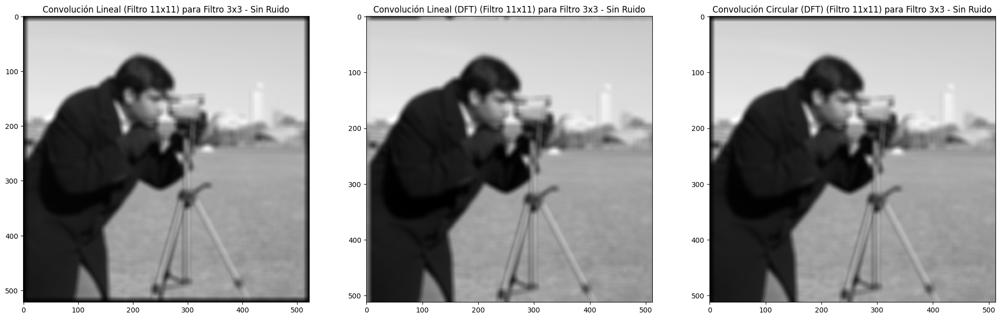

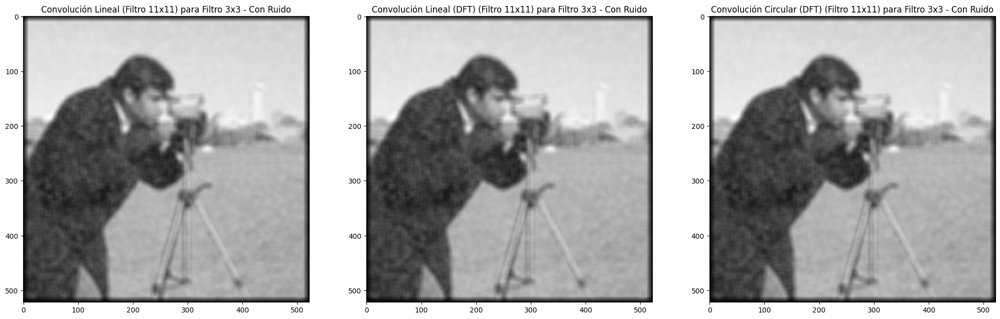

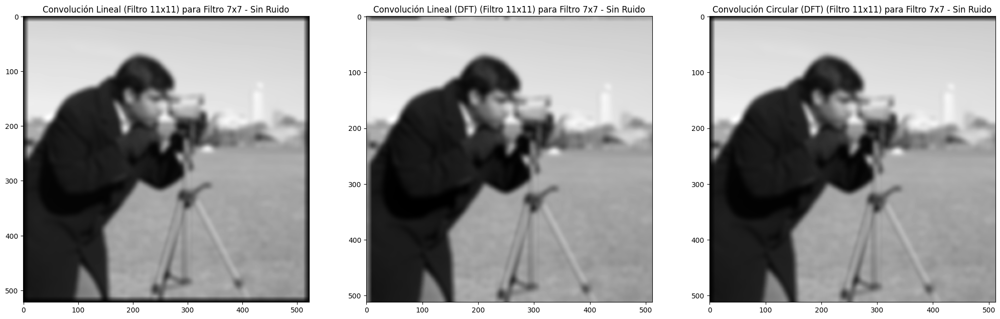

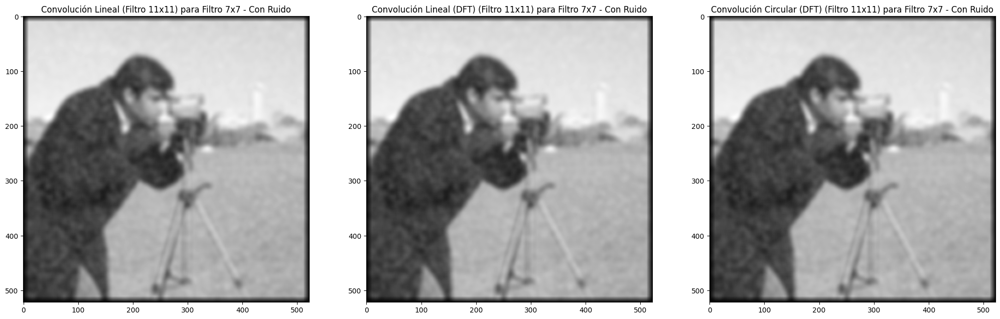

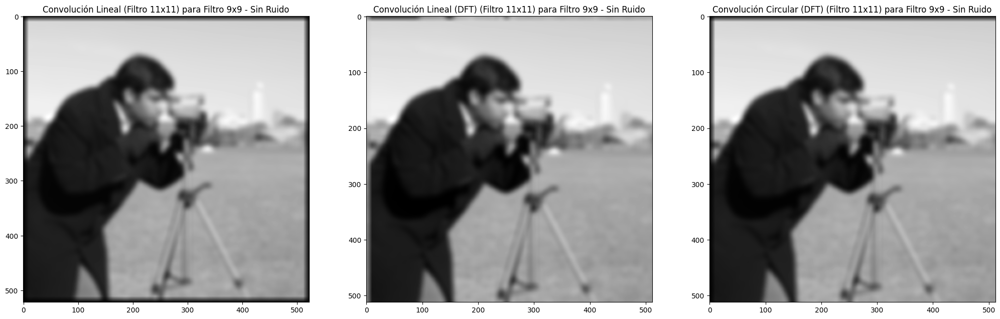

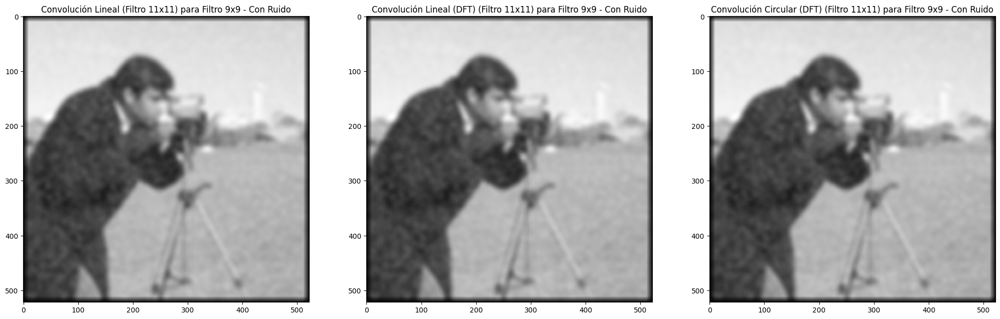

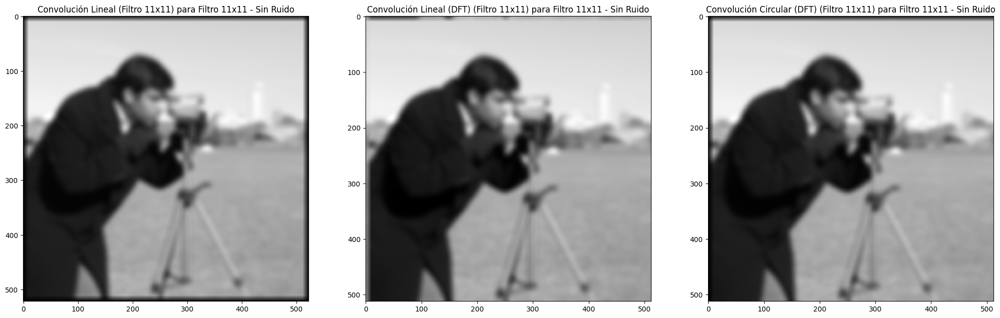

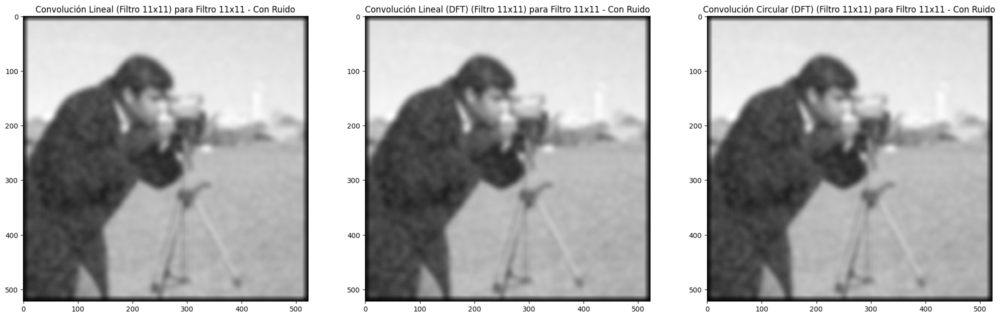

In [ ]:
def convolucion_dft_circular(imagen, filtro):
    """
    Realiza la convolución circular de la imagen con el filtro utilizando la DFT.

    Args:
        imagen (numpy.ndarray): La imagen de entrada.
        filtro (numpy.ndarray): El filtro a aplicar.

    Returns:
        numpy.ndarray: La imagen convolucionada.
    """
    # Calcula las dimensiones para hacer la convolución circular
    M, N = imagen.shape
    P, Q = filtro.shape

    # Extiende la imagen para que ambas tengan las mismas dimensiones
    imagen_ext = np.pad(imagen, ((0, P-1), (0, Q-1)), mode='constant')

    # Calcula la DFT de la imagen extendida y el filtro
    imagen_fft = fft.fft2(imagen_ext)
    filtro_fft = fft.fft2(filtro, s=imagen_ext.shape)

    # Realiza la multiplicación en el dominio de la frecuencia
    resultado_fft = imagen_fft * filtro_fft

    # Calcula la IDFT y toma la parte real para obtener la convolución circular
    resultado = np.fft.ifft2(resultado_fft).real

    # Recorta el resultado para que tenga las mismas dimensiones que la imagen original
    resultado = resultado[:M, :N]

    return resultado


# Definir el filtro 11x11
filtro_11x11 = np.ones((11, 11)) / 121  # Filtro paso bajas 11x11

for item in imagenes_resultantes_2:

    # Realizar la convolución lineal usando filtro 11x11
    resultado_lineal = signal.convolve2d(item['sin_ruido'][0], filtro_11x11, mode='full', boundary='fill', fillvalue=0)

    # Realizar la convolución lineal (DFT) usando filtro 11x11
    resultado_lineal_dft = convolucion_dft(item['sin_ruido'][0], filtro_11x11)

    # Realizar la convolución circular (DFT) usando filtro 11x11
    resultado_circular_dft = convolucion_dft_circular(item['sin_ruido'][0], filtro_11x11)

    # Mostrar las imágenes resultantes
    plt.figure(figsize=(25, 8))
    plt.subplot(131), plt.imshow(resultado_lineal, cmap='gray'), plt.title('Convolución Lineal (Filtro 11x11) para ' + item['sin_ruido'][1])
    plt.subplot(132), plt.imshow(resultado_lineal_dft, cmap='gray'), plt.title('Convolución Lineal (DFT) (Filtro 11x11) para ' + item['sin_ruido'][1])
    plt.subplot(133), plt.imshow(resultado_circular_dft, cmap='gray'), plt.title('Convolución Circular (DFT) (Filtro 11x11) para ' + item['sin_ruido'][1])
    plt.show()

    # Realizar la convolución lineal usando filtro 11x11
    resultado_lineal = signal.convolve2d(item['con_ruido'][0], filtro_11x11, mode='full', boundary='fill', fillvalue=0)

    # Realizar la convolución lineal (DFT) usando filtro 11x11
    resultado_lineal_dft = signal.fftconvolve(item['con_ruido'][0], filtro_11x11, mode='full')

    # Realizar la convolución circular (DFT) usando filtro 11x11
    resultado_circular_dft = signal.fftconvolve(item['con_ruido'][0], filtro_11x11, mode='full')

    # Mostrar las imágenes resultantes
    plt.figure(figsize=(25, 8))
    plt.subplot(131), plt.imshow(resultado_lineal, cmap='gray'), plt.title('Convolución Lineal (Filtro 11x11) para ' + item['con_ruido'][1])
    plt.subplot(132), plt.imshow(resultado_lineal_dft, cmap='gray'), plt.title('Convolución Lineal (DFT) (Filtro 11x11) para ' + item['con_ruido'][1])
    plt.subplot(133), plt.imshow(resultado_circular_dft, cmap='gray'), plt.title('Convolución Circular (DFT) (Filtro 11x11) para ' + item['con_ruido'][1])
    plt.show()

# EXTRA Práctica filtrado espacial avanzado - Difusión selectiva

In [ ]:
import cv2
import numpy as np

# Cargar la imagen Lena en escala de grises
img = cv2.imread('lena.tif', cv2.IMREAD_GRAYSCALE)
img = img.astype(np.float64)

## 1. Conv

### 1.a. Con loops

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import time

# Definir una función de convolución basada en la fórmula dada
def convolution_loops(image, n):
    height, width = image.shape
    result = image.copy()

    for _ in range(n):
        temp_result = np.zeros_like(image, dtype=np.float64)

        for i in range(1, height - 1):
            for j in range(1, width - 1):
                # Calcular el promedio de los píxeles vecinos
                average = (result[i - 1, j] + result[i + 1, j] + result[i, j - 1] + result[i, j + 1]) / 4.0
                temp_result[i, j] = average

        result = temp_result

    return result

# Aplicar la función de convolución con diferentes valores de n
start = time.time()
filtered_image_1 = convolution_loops(img, 1)
filtered_image_10 = convolution_loops(img, 10)
filtered_image_50 = convolution_loops(img, 50)
loops = time.time() - start
print(loops)

3.72202205657959


### 1.b. Sin loops

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Definir una función de convolución basada en corrimientos
def convolution(image, n):
    # Realizar el corrimiento a la derecha, izquierda, arriba y abajo
    fright = np.roll(image, shift=1, axis=1)
    fleft = np.roll(image, shift=-1, axis=1)
    fup = np.roll(image, shift=-1, axis=0)
    fdown = np.roll(image, shift=1, axis=0)

    # Calcular el promedio
    result = (fright + fleft + fup + fdown) / 4.0

    for _ in range(n - 1):
        fright = np.roll(result, shift=1, axis=1)
        fleft = np.roll(result, shift=-1, axis=1)
        fup = np.roll(result, shift=-1, axis=0)
        fdown = np.roll(result, shift=1, axis=0)

        result = (fright + fleft + fup + fdown) / 4.0

    return result

# Aplicar la función de corrimientos 1 vez, 10 veces y 50 veces
start = time.time()
filtered_image_1 = convolution(img, 1)
filtered_image_10 = convolution(img, 10)
filtered_image_50 = convolution(img, 50)
sin_loops = time.time() - start
print(sin_loops)
print(f'{loops/sin_loops} veces más rapido.')

0.02227926254272461
167.0621749459581 veces más rapido.


### Resultados

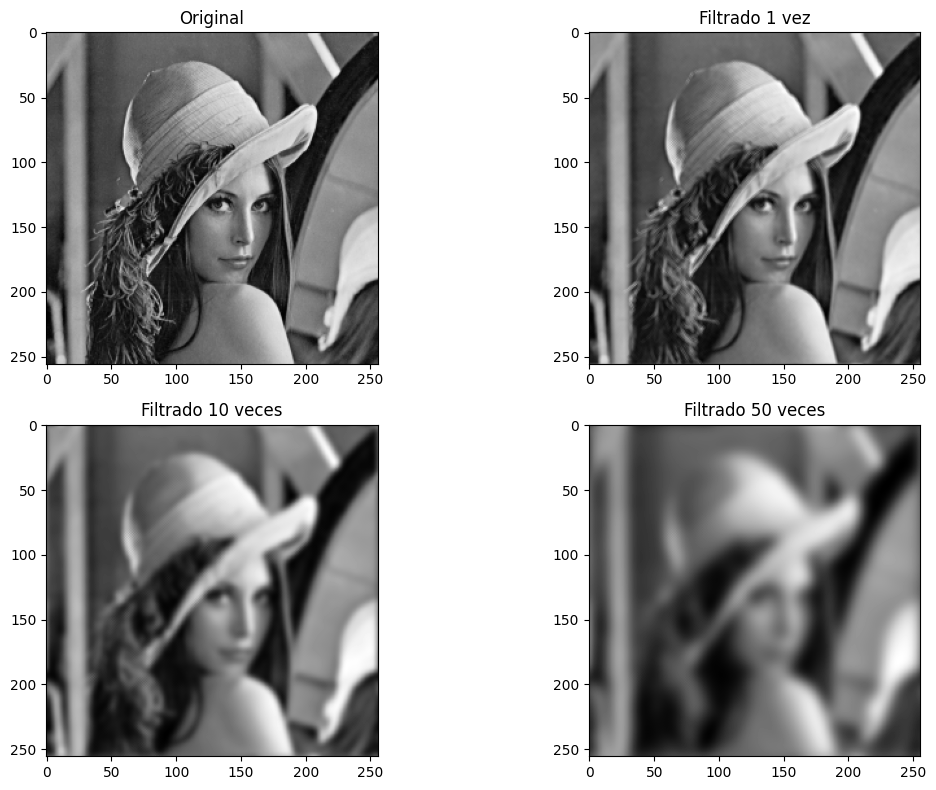

In [ ]:
import matplotlib.pyplot as plt

def plt_img(img, title, position):
    plt.subplot(2, 2, position)
    plt.imshow(img, cmap='gray')
    plt.title(title)

plt.figure(figsize=(12, 8))  # Create a larger figure to accommodate all four images

# Plot the original image
plt_img(img, 'Original', 1)

# Plot the filtered images
plt_img(filtered_image_1, 'Filtrado 1 vez', 2)
plt_img(filtered_image_10, 'Filtrado 10 veces', 3)
plt_img(filtered_image_50, 'Filtrado 50 veces', 4)

plt.tight_layout()  # Adjust the layout for better spacing
plt.show()


## 2. Difusion Anisotropica

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def anisotropic_diffuse(image, K, n):
    result = image.astype(np.float64)
    rows, cols = image.shape

    for _ in range(n):
        # Calcular las diferencias entre píxeles vecinos
        d_left = np.roll(result, shift=1, axis=1) - result
        d_right = np.roll(result, shift=-1, axis=1) - result
        d_up = np.roll(result, shift=1, axis=0) - result
        d_down = np.roll(result, shift=-1, axis=0) - result

        # Calcular el factor de difusión basado en K y las diferencias
        w_left = K / (K + d_left**2)
        w_right = K / (K + d_right**2)
        w_up = K / (K + d_up**2)
        w_down = K / (K + d_down**2)

        # Actualizar la imagen utilizando la ecuación de difusión anisotrópica
        result += 0.25 * (w_left * d_left + w_right * d_right + w_up * d_up + w_down * d_down)

    plt_img(result, f'Difusión anisotrópica, K={K}, n={n}')

    return result

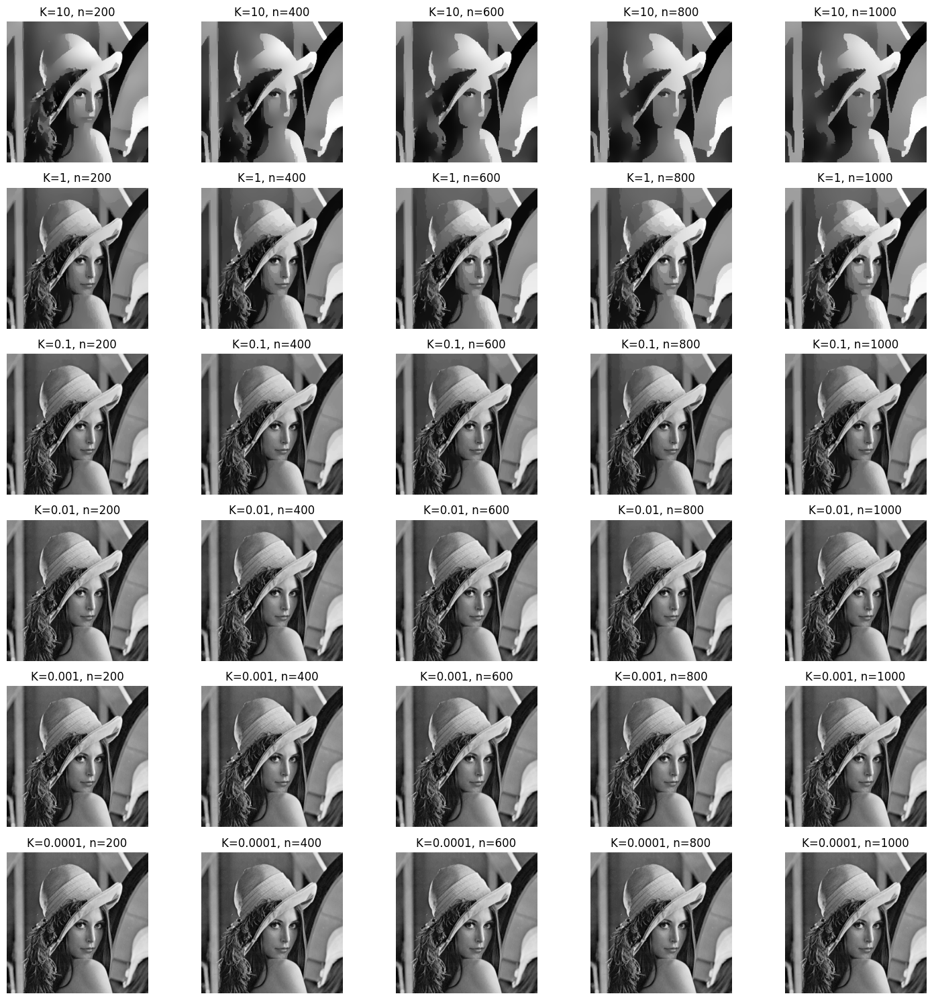

In [ ]:
# Adjust function
def anisotropic_diffuse(image, K, n):
    result = image.astype(np.float64)
    rows, cols = image.shape

    for _ in range(n):
        d_left = np.roll(result, shift=1, axis=1) - result
        d_right = np.roll(result, shift=-1, axis=1) - result
        d_up = np.roll(result, shift=1, axis=0) - result
        d_down = np.roll(result, shift=-1, axis=0) - result

        w_left = K / (K + d_left**2)
        w_right = K / (K + d_right**2)
        w_up = K / (K + d_up**2)
        w_down = K / (K + d_down**2)

        result += 0.25 * (w_left * d_left + w_right * d_right + w_up * d_up + w_down * d_down)

    return result

# Create a grid of experiments for K and n
K_values = [10, 1, 0.1, 0.01, 0.001, 0.0001]
n_values = list(range(200, 1001, 200))

# Create a grid of subplots
fig, axes = plt.subplots(len(K_values), len(n_values), figsize=(15, 15))

# Iterate over K and n values and apply anisotropic diffusion
for i, K in enumerate(K_values):
    for j, n in enumerate(n_values):
        filtered_image = anisotropic_diffuse(img, K, n)
        axes[i, j].imshow(filtered_image, cmap='gray')
        axes[i, j].set_title(f'K={K}, n={n}')
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()

## 3. BORRADO ESPACIALMENTE VARIANTE

In [ ]:
import numpy as np

def create_mask(image_shape, roi):
    """
    Crea una máscara rectangular para una región de interés (ROI) en una imagen.

    Args:
    - image_shape: Tupla que representa las dimensiones de la imagen (alto, ancho).
    - roi: Tupla que contiene las coordenadas de la región de interés (x1, y1, x2, y2).

    Returns:
    - mask: Máscara binaria con la misma forma que la imagen, donde la ROI es 1 y el resto es 0.
    """
    mask = np.zeros(image_shape, dtype=np.uint8)
    x1, y1, x2, y2 = roi
    mask[y1:y2, x1:x2] = 1
    return mask


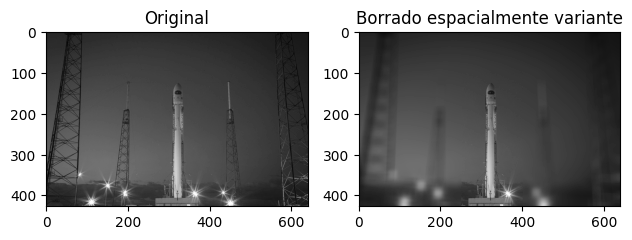

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

import skimage

# Cargar la imagen en escala de grises
input_image = skimage.data.rocket()

# Check if the image is in color (has 3 color channels)
if len(input_image.shape) == 3 and input_image.shape[2] == 3:
    # Convert the image to grayscale
    input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)
else:
    pass

# Verifica si la imagen se ha cargado correctamente
if input_image is None:
    raise ValueError("No se pudo cargar la imagen.")

# Crear una máscara para definir la región de interés (ROI) rectangular
roi = (250, 100, 400, 450)  # (x1, y1, x2, y2)
mask = create_mask(input_image.shape, roi)

# Aplicar un desenfoque gaussiano al fondo de la imagen
blurred_image = cv2.GaussianBlur(input_image, (21, 21), sigmaX=50, sigmaY=50)

# Mezclar la imagen original y la imagen desenfocada usando la máscara de borrado
output_image = np.uint8(input_image * mask + blurred_image * (1 - mask))

plt_img(input_image, 'Original', 1)
plt_img(output_image, 'Borrado espacialmente variante', 2)
plt.tight_layout()  # Adjust the layout for better spacing
plt.show()